# Deep Learning Experiment: Plant Disease Classification

## Project Overview

This notebook implements a full **deep learning experiment workflow** for the task of **plant leaf disease classification** using the [PlantVillage dataset](https://github.com/spMohanty/PlantVillage-Dataset). The dataset contains **54,305 color images** of plant leaves spanning **38 classes** (representing diseases and healthy states across **14 crop species**).

### Objective

Two CNN architectures are built and compared in PyTorch:

| Model | Description |
|-------|-------------|
| **BaselineCNN** | Shallow 2-block CNN with BatchNorm and MLP head |
| **AdvancedCNN** | Deeper residual network with GroupNorm, skip connections, and global average pooling |

The controlled comparison isolates the effect of **architecture depth and residual connections** while keeping all other hyperparameters constant (optimizer, learning rate, batch size, data augmentation, and training epochs).

### Tools & Libraries
- **Python 3** with **PyTorch** (MPS backend on Apple Silicon)
- NumPy, Pandas, Matplotlib for analysis and visualization
- Custom modules: `config.py`, `dataset.py`, `models.py`, `train.py`, `evaluate_model.py`, `utils.py`, `transform.py`

In [1]:
import subprocess
import os
from pathlib import Path
from config import Config
from utils import (
    get_classes2idx,
    class_wise_distribution,
    view_sample_images,
    get_min_max_size,
    select_device,
    setup_config_as_per_device,
    artifact_model_dirs,
    require_best_checkpoint,
    load_optional_metrics,
    prepare_latest_output_dir,
    load_optional_history,
    write_summary_json
    )

from evaluate_model import (
    build_shared_eval_loaders,
    evaluate_model_from_checkpoint,
    print_model_summary,
    plot_split_metrics_comparison,
    plot_test_head_to_head,
    plot_training_curves_comparison,
    plot_confusion_matrices_comparison,
    plot_and_save_per_class_comparison,
    head_to_head_summary
    )
    
import pandas as pd
import matplotlib.pyplot as plt
from train import train_from_config
import splitfolders

## 1. Environment & Device Configuration

The project configuration is initialized and the available compute device is detected. On Apple Silicon Macs, the **MPS (Metal Performance Shaders)** backend provides GPU acceleration for PyTorch operations.

In [2]:
cfg = Config()
cfg.device = str(select_device(device_pref=cfg.device))

In [3]:
cfg = setup_config_as_per_device(cfg)

## 2. Dataset Acquisition

The PlantVillage dataset is stored locally at `data/plantvillage dataset/color/`. The dataset contains:

- **54,305 RGB images** at a uniform resolution of **256×256 pixels**
- **38 classes** covering both diseased and healthy leaf conditions
- **14 crop species**: Apple, Blueberry, Cherry, Corn, Grape, Orange, Peach, Pepper, Potato, Raspberry, Soybean, Squash, Strawberry, and Tomato

Source: [PlantVillage Dataset](https://www.kaggle.com/api/v1/datasets/download/abdallahalidev/plantvillage-dataset)

In [3]:
DATA_DIR = cfg.data_dir
os.makedirs(DATA_DIR,exist_ok=True)

In [4]:
Dataset_dir = cfg.dataset_dir
zip_file = cfg.zip_file

print(f"[DATA] Target dataset dir: {Dataset_dir}")
print(f"[DATA] Target zip path:   {zip_file}")

if Dataset_dir.exists() and any(Dataset_dir.iterdir()):
    print("[DATA] Dataset directory already exists. Skipping download/unzip.")
else:
    Dataset_dir.mkdir(parents=True, exist_ok=True)
    print("[DATA] Created dataset directory.")

    if not zip_file.exists():
        url = "https://www.kaggle.com/api/v1/datasets/download/abdallahalidev/plantvillage-dataset"
        print(f"[DL] Downloading from Kaggle API...\n     url={url}\n     out={zip_file}")

        subprocess.run(
            ["curl", "-fL", "-o", str(zip_file), url],
            check=True,
        )
        print("[DL] Download complete.")
    else:
        print("[DL] Zip already exists. Skipping download.")

    # unzip only if the dir looks empty (avoids re-unzipping every run)
    has_files = any(Dataset_dir.iterdir())
    if has_files:
        print("[UNZIP] Dataset directory is not empty. Skipping unzip.")
    else:
        print(f"[UNZIP] Extracting zip -> {DATA_DIR}")
        subprocess.run(
            ["unzip", "-q", str(zip_file), "-d", str(DATA_DIR)],
            check=True,
        )
        print("[UNZIP] Extraction complete.")

[DATA] Target dataset dir: data/plantvillage dataset
[DATA] Target zip path:   data/plantvillage-dataset.zip
[DATA] Dataset directory already exists. Skipping download/unzip.


## 3. Exploratory Data Analysis

### 3.1 Class Mapping & Distribution

A deterministic `class_name → index` mapping is created from the sorted subdirectory names, and per-class image counts are computed. The 38 classes follow the naming convention `Plant___Disease` (e.g., `Tomato___Early_blight`, `Apple___healthy`).

In [5]:
idx2classes = {}
images_folder = cfg.images_folder

classes2idx  = get_classes2idx(images_folder)

In [6]:
class_wise_dist = class_wise_distribution(images_folder)

### 3.2 Class Distribution Visualization

The bar chart below shows per-class image counts sorted in descending order. This helps identify any **class imbalance** that may affect training. To mitigate imbalance, the training pipeline uses a `WeightedRandomSampler` to ensure balanced class representation within each batch.

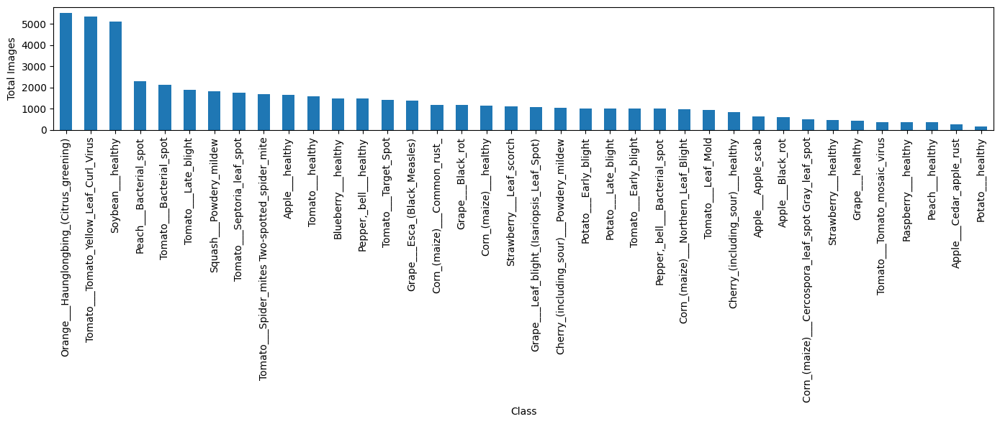

In [7]:
df = class_wise_dist[["name", "total_images"]].copy()
df = df.sort_values("total_images", ascending=False)

ax = df.plot(kind="bar", x="name", y="total_images", legend=False, figsize=(14, 6))
ax.set_xlabel("Class")
ax.set_ylabel("Total Images")
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

### 3.3 Sample Images

Viewing randomly sampled images from each class helps verify image quality, inspect visual differences between diseases, and confirm that labels align with the visual content.


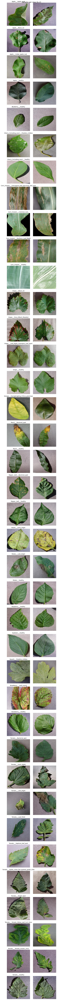

In [8]:
view_sample_images(images_folder, 2)

### 3.4 Image Size Verification

All 54,303 images are scanned to confirm uniform resolution. The PlantVillage dataset has already been preprocessed to a consistent **256×256** pixel size, so no additional resizing beyond the transform pipeline is needed.

In [9]:
get_min_max_size(images_folder)

Scanning images: 100%|██████████| 54303/54303 [00:10<00:00, 5123.64img/s]

[get_min_max_size] scanned=54303 failed=0
[get_min_max_size] min_size(WxH)=256x256
[get_min_max_size] max_size(WxH)=256x256


## 4. Data Splitting & Preprocessing

The dataset is split into training, validation, and test sets using an **80/10/10 ratio** (seed=42 for reproducibility):

| Split | Samples |
|-------|---------|
| Train | 43,429 |
| Validation | 5,417 |
| Test | 5,459 |

### Normalization Statistics (computed from training set)

| Channel | Mean | Std |
|---------|------|-----|
| Red | 0.4666 | 0.1991 |
| Green | 0.4891 | 0.1748 |
| Blue | 0.4104 | 0.2173 |

### Data Augmentation (training only)
- `RandomHorizontalFlip(p=0.5)`
- `RandomRotation(degrees=10)`
- `ColorJitter(brightness=0.1, contrast=0.1, saturation=0.1, hue=0.02)`

Validation and test splits use only resize + normalization (no augmentation).


In [4]:
if not cfg.split_folder.exists():
    splitfolders.ratio(images_folder, output=cfg.split_folder, seed=42, ratio=(.8, 0.1,0.1))
else:
    print("Data already splitted")

Data already splitted


## 5. Baseline Model Training

### Architecture: `BaselineCNN`

A shallow CNN with two convolutional blocks followed by a fully connected classifier:

```
Feature Extractor:
  Conv2d(3→32, 3×3) → ReLU → BatchNorm2d → MaxPool2d(2×2)
  Conv2d(32→64, 3×3) → ReLU → BatchNorm2d → MaxPool2d(2×2)

Classifier:
  Flatten → Linear(262144→128) → ReLU → Dropout(0.4)
           → Linear(128→64)     → ReLU → Dropout(0.4)
           → Linear(64→38)
```

### Training Configuration

| Parameter | Value |
|-----------|-------|
| Optimizer | AdamW |
| Learning Rate | 1e-3 |
| Weight Decay | 1e-4 |
| Scheduler | CosineAnnealingLR (T_max=30) |
| Batch Size | 32 |
| Epochs | 30 |
| Loss Function | CrossEntropyLoss |
| Device | MPS (Apple Silicon GPU) |


In [16]:
cfg.model_name = "baseline"
train_from_config(cfg)

[stats] loaded normalization stats from data/output/normalization_stats.json
[data] sample batch shape = (32, 3, 256, 256)
[data] sizes train=43429 val=5417 test=5459 classes=38
[data] normalization_mean=(0.46659470731947583, 0.48914235326917804, 0.4103934013954032) normalization_std=(0.19912769816560152, 0.17484148216436926, 0.21728125965193829)
[data] weighted_sampler=enabled
[model] name=baseline trainable_params=33,584,870
[device] using mps
[train] starting training for 30 epoch(s)


train 1/30: 100%|██████████| 1357/1357 [02:15<00:00, 10.04it/s, acc=0.0932, batch_loss=3.4060, loss=3.5824, lr=0.001000]


[epoch 1/30] train_loss=3.5824 train_acc=0.0932 val_loss=3.1789 val_acc=0.1111 lr=0.000997


train 2/30: 100%|██████████| 1357/1357 [02:12<00:00, 10.26it/s, acc=0.1196, batch_loss=3.0477, loss=3.1845, lr=0.000997]


[epoch 2/30] train_loss=3.1845 train_acc=0.1196 val_loss=3.0115 val_acc=0.1602 lr=0.000989


train 3/30: 100%|██████████| 1357/1357 [02:12<00:00, 10.22it/s, acc=0.1273, batch_loss=3.1336, loss=3.0768, lr=0.000989]


[epoch 3/30] train_loss=3.0768 train_acc=0.1273 val_loss=2.8800 val_acc=0.1246 lr=0.000976


train 4/30: 100%|██████████| 1357/1357 [02:11<00:00, 10.29it/s, acc=0.1393, batch_loss=3.2803, loss=2.9688, lr=0.000976]


[epoch 4/30] train_loss=2.9688 train_acc=0.1393 val_loss=2.6237 val_acc=0.1872 lr=0.000957


train 5/30: 100%|██████████| 1357/1357 [02:12<00:00, 10.21it/s, acc=0.1461, batch_loss=3.1092, loss=2.9358, lr=0.000957]


[epoch 5/30] train_loss=2.9358 train_acc=0.1461 val_loss=2.6118 val_acc=0.1757 lr=0.000933


train 6/30: 100%|██████████| 1357/1357 [02:13<00:00, 10.13it/s, acc=0.1494, batch_loss=2.6209, loss=2.9324, lr=0.000933]


[epoch 6/30] train_loss=2.9324 train_acc=0.1494 val_loss=2.5323 val_acc=0.2367 lr=0.000905


train 7/30: 100%|██████████| 1357/1357 [02:11<00:00, 10.30it/s, acc=0.1602, batch_loss=2.8534, loss=2.8566, lr=0.000905]


[epoch 7/30] train_loss=2.8566 train_acc=0.1602 val_loss=2.4603 val_acc=0.2357 lr=0.000872


train 8/30: 100%|██████████| 1357/1357 [02:12<00:00, 10.27it/s, acc=0.1722, batch_loss=2.9688, loss=2.8080, lr=0.000872]


[epoch 8/30] train_loss=2.8080 train_acc=0.1722 val_loss=2.4922 val_acc=0.1765 lr=0.000835


train 9/30: 100%|██████████| 1357/1357 [02:11<00:00, 10.29it/s, acc=0.1739, batch_loss=2.6130, loss=2.7799, lr=0.000835]


[epoch 9/30] train_loss=2.7799 train_acc=0.1739 val_loss=2.5175 val_acc=0.1924 lr=0.000794


train 10/30: 100%|██████████| 1357/1357 [02:11<00:00, 10.31it/s, acc=0.1852, batch_loss=2.6141, loss=2.7342, lr=0.000794]


[epoch 10/30] train_loss=2.7342 train_acc=0.1852 val_loss=2.3201 val_acc=0.2858 lr=0.000750


train 11/30: 100%|██████████| 1357/1357 [02:10<00:00, 10.41it/s, acc=0.1847, batch_loss=2.7605, loss=2.7143, lr=0.000750]


[epoch 11/30] train_loss=2.7143 train_acc=0.1847 val_loss=2.3692 val_acc=0.2865 lr=0.000703


train 12/30: 100%|██████████| 1357/1357 [02:11<00:00, 10.30it/s, acc=0.1945, batch_loss=2.2855, loss=2.6828, lr=0.000703]


[epoch 12/30] train_loss=2.6828 train_acc=0.1945 val_loss=2.2998 val_acc=0.2330 lr=0.000655


train 13/30: 100%|██████████| 1357/1357 [02:11<00:00, 10.34it/s, acc=0.2021, batch_loss=2.4453, loss=2.6499, lr=0.000655]


[epoch 13/30] train_loss=2.6499 train_acc=0.2021 val_loss=2.2980 val_acc=0.3138 lr=0.000604


train 14/30: 100%|██████████| 1357/1357 [02:12<00:00, 10.23it/s, acc=0.2125, batch_loss=2.5772, loss=2.6046, lr=0.000604]


[epoch 14/30] train_loss=2.6046 train_acc=0.2125 val_loss=2.2071 val_acc=0.2854 lr=0.000552


train 15/30: 100%|██████████| 1357/1357 [02:14<00:00, 10.11it/s, acc=0.2180, batch_loss=2.3824, loss=2.5631, lr=0.000552]


[epoch 15/30] train_loss=2.5631 train_acc=0.2180 val_loss=2.1516 val_acc=0.3061 lr=0.000500


train 16/30: 100%|██████████| 1357/1357 [02:14<00:00, 10.06it/s, acc=0.2284, batch_loss=2.6810, loss=2.5178, lr=0.000500]


[epoch 16/30] train_loss=2.5178 train_acc=0.2284 val_loss=2.0886 val_acc=0.3330 lr=0.000448


train 17/30: 100%|██████████| 1357/1357 [02:13<00:00, 10.19it/s, acc=0.2417, batch_loss=2.0062, loss=2.4666, lr=0.000448]


[epoch 17/30] train_loss=2.4666 train_acc=0.2417 val_loss=2.0552 val_acc=0.3341 lr=0.000396


train 18/30: 100%|██████████| 1357/1357 [02:11<00:00, 10.33it/s, acc=0.2543, batch_loss=2.3579, loss=2.4131, lr=0.000396]


[epoch 18/30] train_loss=2.4131 train_acc=0.2543 val_loss=1.9042 val_acc=0.4091 lr=0.000345


train 19/30: 100%|██████████| 1357/1357 [02:11<00:00, 10.34it/s, acc=0.2708, batch_loss=2.2173, loss=2.3732, lr=0.000345]


[epoch 19/30] train_loss=2.3732 train_acc=0.2708 val_loss=1.9039 val_acc=0.3903 lr=0.000297


train 20/30: 100%|██████████| 1357/1357 [02:11<00:00, 10.32it/s, acc=0.2815, batch_loss=2.3407, loss=2.3211, lr=0.000297]


[epoch 20/30] train_loss=2.3211 train_acc=0.2815 val_loss=1.8856 val_acc=0.3975 lr=0.000250


train 21/30: 100%|██████████| 1357/1357 [02:12<00:00, 10.27it/s, acc=0.2903, batch_loss=2.1339, loss=2.2879, lr=0.000250]


[epoch 21/30] train_loss=2.2879 train_acc=0.2903 val_loss=1.8400 val_acc=0.3951 lr=0.000206


train 22/30: 100%|██████████| 1357/1357 [02:13<00:00, 10.19it/s, acc=0.2958, batch_loss=2.2392, loss=2.2615, lr=0.000206]


[epoch 22/30] train_loss=2.2615 train_acc=0.2958 val_loss=1.8231 val_acc=0.4013 lr=0.000165


train 23/30: 100%|██████████| 1357/1357 [02:13<00:00, 10.20it/s, acc=0.3050, batch_loss=2.5017, loss=2.2297, lr=0.000165]


[epoch 23/30] train_loss=2.2297 train_acc=0.3050 val_loss=1.7358 val_acc=0.4192 lr=0.000128


train 24/30: 100%|██████████| 1357/1357 [02:12<00:00, 10.21it/s, acc=0.3143, batch_loss=1.9864, loss=2.2054, lr=0.000128]


[epoch 24/30] train_loss=2.2054 train_acc=0.3143 val_loss=1.7303 val_acc=0.4144 lr=0.000095


train 25/30: 100%|██████████| 1357/1357 [02:12<00:00, 10.25it/s, acc=0.3151, batch_loss=2.2073, loss=2.1887, lr=0.000095]


[epoch 25/30] train_loss=2.1887 train_acc=0.3151 val_loss=1.6941 val_acc=0.4296 lr=0.000067


train 26/30: 100%|██████████| 1357/1357 [02:12<00:00, 10.21it/s, acc=0.3183, batch_loss=2.5946, loss=2.1731, lr=0.000067]


[epoch 26/30] train_loss=2.1731 train_acc=0.3183 val_loss=1.6805 val_acc=0.4198 lr=0.000043


train 27/30: 100%|██████████| 1357/1357 [02:12<00:00, 10.25it/s, acc=0.3219, batch_loss=2.0873, loss=2.1533, lr=0.000043]


[epoch 27/30] train_loss=2.1533 train_acc=0.3219 val_loss=1.6772 val_acc=0.4418 lr=0.000024


train 28/30: 100%|██████████| 1357/1357 [02:12<00:00, 10.25it/s, acc=0.3323, batch_loss=2.1432, loss=2.1479, lr=0.000024]


[epoch 28/30] train_loss=2.1479 train_acc=0.3323 val_loss=1.6711 val_acc=0.4327 lr=0.000011


train 29/30: 100%|██████████| 1357/1357 [02:11<00:00, 10.29it/s, acc=0.3335, batch_loss=1.9377, loss=2.1329, lr=0.000011]


[epoch 29/30] train_loss=2.1329 train_acc=0.3335 val_loss=1.6736 val_acc=0.4381 lr=0.000003


train 30/30: 100%|██████████| 1357/1357 [02:11<00:00, 10.35it/s, acc=0.3271, batch_loss=2.2777, loss=2.1431, lr=0.000003]


[epoch 30/30] train_loss=2.1431 train_acc=0.3271 val_loss=1.6661 val_acc=0.4344 lr=0.000000


[done] best_epoch=27 best_val_acc=0.4418 test_loss=1.7000 test_acc=0.4312
[done] artifacts written to /Users/biitu/Documents/Code/Learn/Udacity Masters/Projects/Capstone/Project 4/artifacts/baseline_cnn


## 6. Advanced Model Training (Experimental Comparison)

### Architecture: `AdvancedCNN`

A deeper residual CNN using `ResidualGNBlock` (GroupNorm + skip connections) with global average pooling:

```
Stem:   Conv2d(3→32, 3×3) → GroupNorm(8) → ReLU

Stage 1: 2× ResidualGNBlock(32→32,  stride=1)   → 256×256
Stage 2: 2× ResidualGNBlock(32→64,  stride=2)   → 128×128
Stage 3: 2× ResidualGNBlock(64→128, stride=2)   →  64×64
Stage 4: 2× ResidualGNBlock(128→256, stride=2)  →  32×32

Head:   AdaptiveAvgPool2d(1×1) → Flatten → Dropout(0.3) → Linear(256→38)
```

### Controlled Experiment Design

| Aspect | Baseline | Advanced |
|--------|----------|----------|
| **Architecture** | 2 conv blocks + MLP | 4 residual stages + global pooling |
| **Normalization** | BatchNorm | GroupNorm (8 groups) |
| **Skip Connections** | None | Residual (identity + projection) |
| **Classifier** | Flatten + large FC layers | AdaptiveAvgPool + single FC |
| **Dropout** | 0.4 | 0.3 |
| Optimizer | AdamW | AdamW |
| LR / Scheduler | 1e-3 / CosineAnnealing | 1e-3 / CosineAnnealing |
| Batch Size / Epochs | 32 / 30 | 32 / 30 |

**Only the architecture was changed** — all training hyperparameters remain identical to ensure a controlled comparison.


In [5]:
cfg.model_name = "advanced"
train_from_config(cfg)

[stats] loaded normalization stats from data/output/normalization_stats.json
[data] sample batch shape = (32, 3, 256, 256)
[data] sizes train=43429 val=5417 test=5459 classes=38
[data] normalization_mean=(0.46659470731947583, 0.48914235326917804, 0.4103934013954032) normalization_std=(0.19912769816560152, 0.17484148216436926, 0.21728125965193829)
[data] weighted_sampler=enabled
[model] name=advanced trainable_params=2,804,806
[device] using mps
[train] starting training for 30 epoch(s)


train 1/30: 100%|██████████| 1357/1357 [31:48<00:00,  1.41s/it, acc=0.1331, batch_loss=2.4986, loss=3.0180, lr=0.001000]


[epoch 1/30] train_loss=3.0180 train_acc=0.1331 val_loss=2.2742 val_acc=0.3299 lr=0.000997


train 2/30: 100%|██████████| 1357/1357 [31:43<00:00,  1.40s/it, acc=0.5447, batch_loss=1.2384, loss=1.4648, lr=0.000997]


[epoch 2/30] train_loss=1.4648 train_acc=0.5447 val_loss=0.9353 val_acc=0.7050 lr=0.000989


train 3/30: 100%|██████████| 1357/1357 [31:45<00:00,  1.40s/it, acc=0.7634, batch_loss=0.3940, loss=0.7531, lr=0.000989]


[epoch 3/30] train_loss=0.7531 train_acc=0.7634 val_loss=0.4674 val_acc=0.8551 lr=0.000976


train 4/30: 100%|██████████| 1357/1357 [31:47<00:00,  1.41s/it, acc=0.8474, batch_loss=0.5829, loss=0.4814, lr=0.000976]


[epoch 4/30] train_loss=0.4814 train_acc=0.8474 val_loss=0.4161 val_acc=0.8713 lr=0.000957


train 5/30: 100%|██████████| 1357/1357 [31:45<00:00,  1.40s/it, acc=0.8849, batch_loss=0.1415, loss=0.3581, lr=0.000957]


[epoch 5/30] train_loss=0.3581 train_acc=0.8849 val_loss=0.3078 val_acc=0.9023 lr=0.000933


train 6/30: 100%|██████████| 1357/1357 [31:42<00:00,  1.40s/it, acc=0.9078, batch_loss=0.1908, loss=0.2856, lr=0.000933]


[epoch 6/30] train_loss=0.2856 train_acc=0.9078 val_loss=0.2201 val_acc=0.9311 lr=0.000905


train 7/30: 100%|██████████| 1357/1357 [31:46<00:00,  1.40s/it, acc=0.9252, batch_loss=0.1454, loss=0.2338, lr=0.000905]


[epoch 7/30] train_loss=0.2338 train_acc=0.9252 val_loss=0.2049 val_acc=0.9363 lr=0.000872


train 8/30: 100%|██████████| 1357/1357 [31:45<00:00,  1.40s/it, acc=0.9367, batch_loss=0.3223, loss=0.1916, lr=0.000872]


[epoch 8/30] train_loss=0.1916 train_acc=0.9367 val_loss=0.1470 val_acc=0.9555 lr=0.000835


train 9/30: 100%|██████████| 1357/1357 [31:42<00:00,  1.40s/it, acc=0.9515, batch_loss=0.1391, loss=0.1486, lr=0.000835]


[epoch 9/30] train_loss=0.1486 train_acc=0.9515 val_loss=0.2173 val_acc=0.9280 lr=0.000794


train 10/30: 100%|██████████| 1357/1357 [31:46<00:00,  1.40s/it, acc=0.9552, batch_loss=0.0986, loss=0.1358, lr=0.000794]


[epoch 10/30] train_loss=0.1358 train_acc=0.9552 val_loss=0.1061 val_acc=0.9653 lr=0.000750


train 11/30: 100%|██████████| 1357/1357 [31:46<00:00,  1.40s/it, acc=0.9630, batch_loss=0.0413, loss=0.1150, lr=0.000750]


[epoch 11/30] train_loss=0.1150 train_acc=0.9630 val_loss=0.0862 val_acc=0.9712 lr=0.000703


train 12/30: 100%|██████████| 1357/1357 [31:44<00:00,  1.40s/it, acc=0.9672, batch_loss=0.0743, loss=0.1002, lr=0.000703]


[epoch 12/30] train_loss=0.1002 train_acc=0.9672 val_loss=0.0901 val_acc=0.9703 lr=0.000655


train 13/30: 100%|██████████| 1357/1357 [31:44<00:00,  1.40s/it, acc=0.9734, batch_loss=0.0418, loss=0.0819, lr=0.000655]


[epoch 13/30] train_loss=0.0819 train_acc=0.9734 val_loss=0.0603 val_acc=0.9821 lr=0.000604


train 14/30: 100%|██████████| 1357/1357 [31:43<00:00,  1.40s/it, acc=0.9760, batch_loss=0.0628, loss=0.0730, lr=0.000604]


[epoch 14/30] train_loss=0.0730 train_acc=0.9760 val_loss=0.0627 val_acc=0.9784 lr=0.000552


train 15/30: 100%|██████████| 1357/1357 [31:37<00:00,  1.40s/it, acc=0.9789, batch_loss=0.0237, loss=0.0642, lr=0.000552]


[epoch 15/30] train_loss=0.0642 train_acc=0.9789 val_loss=0.0760 val_acc=0.9751 lr=0.000500


train 16/30: 100%|██████████| 1357/1357 [31:41<00:00,  1.40s/it, acc=0.9821, batch_loss=0.2558, loss=0.0537, lr=0.000500]


[epoch 16/30] train_loss=0.0537 train_acc=0.9821 val_loss=0.0671 val_acc=0.9799 lr=0.000448


train 17/30: 100%|██████████| 1357/1357 [31:40<00:00,  1.40s/it, acc=0.9843, batch_loss=0.0182, loss=0.0479, lr=0.000448]


[epoch 17/30] train_loss=0.0479 train_acc=0.9843 val_loss=0.0469 val_acc=0.9841 lr=0.000396


train 18/30: 100%|██████████| 1357/1357 [31:44<00:00,  1.40s/it, acc=0.9871, batch_loss=0.0277, loss=0.0410, lr=0.000396]


[epoch 18/30] train_loss=0.0410 train_acc=0.9871 val_loss=0.0525 val_acc=0.9826 lr=0.000345


train 19/30: 100%|██████████| 1357/1357 [31:44<00:00,  1.40s/it, acc=0.9898, batch_loss=0.0278, loss=0.0322, lr=0.000345]


[epoch 19/30] train_loss=0.0322 train_acc=0.9898 val_loss=0.0377 val_acc=0.9880 lr=0.000297


train 20/30: 100%|██████████| 1357/1357 [31:36<00:00,  1.40s/it, acc=0.9911, batch_loss=0.0036, loss=0.0275, lr=0.000297]


[epoch 20/30] train_loss=0.0275 train_acc=0.9911 val_loss=0.0386 val_acc=0.9869 lr=0.000250


train 21/30: 100%|██████████| 1357/1357 [31:43<00:00,  1.40s/it, acc=0.9920, batch_loss=0.0066, loss=0.0245, lr=0.000250]


[epoch 21/30] train_loss=0.0245 train_acc=0.9920 val_loss=0.0397 val_acc=0.9882 lr=0.000206


train 22/30: 100%|██████████| 1357/1357 [31:37<00:00,  1.40s/it, acc=0.9942, batch_loss=0.0045, loss=0.0184, lr=0.000206]


[epoch 22/30] train_loss=0.0184 train_acc=0.9942 val_loss=0.0316 val_acc=0.9893 lr=0.000165


train 23/30: 100%|██████████| 1357/1357 [31:38<00:00,  1.40s/it, acc=0.9945, batch_loss=0.0191, loss=0.0179, lr=0.000165]


[epoch 23/30] train_loss=0.0179 train_acc=0.9945 val_loss=0.0323 val_acc=0.9900 lr=0.000128


train 24/30: 100%|██████████| 1357/1357 [31:39<00:00,  1.40s/it, acc=0.9959, batch_loss=0.0019, loss=0.0133, lr=0.000128]


[epoch 24/30] train_loss=0.0133 train_acc=0.9959 val_loss=0.0251 val_acc=0.9917 lr=0.000095


train 25/30: 100%|██████████| 1357/1357 [31:38<00:00,  1.40s/it, acc=0.9966, batch_loss=0.0018, loss=0.0112, lr=0.000095]


[epoch 25/30] train_loss=0.0112 train_acc=0.9966 val_loss=0.0250 val_acc=0.9915 lr=0.000067


train 26/30: 100%|██████████| 1357/1357 [31:40<00:00,  1.40s/it, acc=0.9972, batch_loss=0.0067, loss=0.0095, lr=0.000067]


[epoch 26/30] train_loss=0.0095 train_acc=0.9972 val_loss=0.0223 val_acc=0.9934 lr=0.000043


train 27/30: 100%|██████████| 1357/1357 [31:57<00:00,  1.41s/it, acc=0.9980, batch_loss=0.0007, loss=0.0081, lr=0.000043]


[epoch 27/30] train_loss=0.0081 train_acc=0.9980 val_loss=0.0202 val_acc=0.9935 lr=0.000024


train 28/30: 100%|██████████| 1357/1357 [34:49<00:00,  1.54s/it, acc=0.9978, batch_loss=0.0002, loss=0.0081, lr=0.000024]


[epoch 28/30] train_loss=0.0081 train_acc=0.9978 val_loss=0.0208 val_acc=0.9928 lr=0.000011


train 29/30: 100%|██████████| 1357/1357 [31:39<00:00,  1.40s/it, acc=0.9980, batch_loss=0.0058, loss=0.0075, lr=0.000011]


[epoch 29/30] train_loss=0.0075 train_acc=0.9980 val_loss=0.0184 val_acc=0.9943 lr=0.000003


train 30/30: 100%|██████████| 1357/1357 [31:45<00:00,  1.40s/it, acc=0.9987, batch_loss=0.0004, loss=0.0058, lr=0.000003]


[epoch 30/30] train_loss=0.0058 train_acc=0.9987 val_loss=0.0188 val_acc=0.9943 lr=0.000000


[done] best_epoch=29 best_val_acc=0.9943 test_loss=0.0216 test_acc=0.9943
[done] artifacts written to /Users/biitu/Documents/Code/Learn/Udacity Masters/Projects/Capstone/Project 4/artifacts/advanced_cnn


## 7. Model Evaluation

Shared evaluation DataLoaders are loaded (using the same normalization statistics and class mapping) to ensure both models are evaluated on identical data. Each model's **best checkpoint** (selected by highest validation accuracy during training) is loaded and evaluated on train, validation, and test splits.

In [4]:
loaders = build_shared_eval_loaders(cfg)
print(
    f"[eval] normalization_mean={loaders['normalization_mean']} normalization_std={loaders['normalization_std']}"
)
print(
    f"[eval] data sizes train={loaders['train_size']} val={loaders['val_size']} test={loaders['test_size']} "
    f"classes={len(loaders['class_names'])}"
)

[stats] loaded normalization stats from data/output/normalization_stats.json
[eval] normalization_mean=(0.46659470731947583, 0.48914235326917804, 0.4103934013954032) normalization_std=(0.19912769816560152, 0.17484148216436926, 0.21728125965193829)
[eval] data sizes train=43429 val=5417 test=5459 classes=38


In [5]:
model_dirs = artifact_model_dirs(cfg)
baseline_ckpt = require_best_checkpoint("baseline", model_dirs["baseline"])

baseline_result = evaluate_model_from_checkpoint(
    model_name="baseline",
    ckpt_path=baseline_ckpt,
    cfg=cfg,
    loaders=loaders,
    device=cfg.device,
)

baseline-test: 100%|██████████| 171/171 [00:09<00:00, 18.41it/s, acc=0.4312, batch_loss=0.1047, loss=1.7000]


In [6]:
advanced_ckpt = require_best_checkpoint("advanced", model_dirs["advanced"])
advanced_result = evaluate_model_from_checkpoint(
    model_name="advanced",
    ckpt_path=advanced_ckpt,
    cfg=cfg,
    loaders=loaders,
    device=cfg.device,
)

advanced-test: 100%|██████████| 171/171 [01:46<00:00,  1.60it/s, acc=0.9943, batch_loss=0.0034, loss=0.0216]


In [7]:
if baseline_result["class_to_idx"] != advanced_result["class_to_idx"]:
    raise ValueError("Class mapping mismatch between baseline and advanced checkpoints.")

### 7.1 Evaluation Results

Both models were evaluated using their best checkpoints, selected by highest validation accuracy during training.

| Metric | Baseline CNN | Advanced CNN |
|--------|-------------|-------------|
| **Best Epoch** | 27 | 29 |
| **Best Val Accuracy** | 44.18% | 99.43% |
| **Test Accuracy** | 43.12% | 99.43% |
| **Test Loss** | 1.7000 | 0.0216 |
| Train Accuracy | 44.62% | 99.91% |
| Train Loss | 1.6782 | 0.0040 |

### Head-to-Head Comparison

- **Test accuracy delta (Advanced − Baseline):** +56.31 percentage points
- **Relative accuracy gain:** +130.59%
- **Test loss reduction:** −1.6784
- **Verdict:** Advanced CNN decisively outperforms the Baseline CNN

The baseline model significantly underfits the data, reaching only ~44% validation accuracy after 30 epochs. Its shallow architecture (only 2 conv layers) lacks the representational capacity to learn the complex visual patterns across 38 plant disease classes. In contrast, the Advanced CNN with residual connections and deeper feature hierarchy reaches >99% accuracy, demonstrating the critical importance of architectural depth and skip connections for this task.


In [8]:
baseline_metrics_json = load_optional_metrics("baseline", model_dirs["baseline"])
advanced_metrics_json = load_optional_metrics("advanced", model_dirs["advanced"])

print_model_summary("baseline", baseline_result, baseline_metrics_json)
print_model_summary("advanced", advanced_result, advanced_metrics_json)


[summary:baseline]
  checkpoint: artifacts/baseline_cnn/best.pth
  best_epoch (from checkpoint): 27
  best_epoch (from metrics.json): 27
  train: loss=1.6782 acc=0.4462 | val: loss=1.6772 acc=0.4418 | test: loss=1.7000 acc=0.4312

[summary:advanced]
  checkpoint: artifacts/advanced_cnn/best.pth
  best_epoch (from checkpoint): 29
  best_epoch (from metrics.json): 29
  train: loss=0.0040 acc=0.9991 | val: loss=0.0184 acc=0.9943 | test: loss=0.0216 acc=0.9943


In [9]:
deltas = head_to_head_summary(baseline_result, advanced_result)


[head-to-head:test]
  baseline_test_acc=0.431215 advanced_test_acc=0.994321
  baseline_test_loss=1.700038 advanced_test_loss=0.021646
  accuracy_delta(advanced-baseline)=+0.563107
  relative_accuracy_gain=+130.59%
  loss_delta(advanced-baseline)=-1.678392
  verdict: advanced outperforms baseline on test accuracy by 0.5631 points


### 7.2 Comparison Visualizations

#### Split Metrics Comparison

The bar chart below compares **loss** and **accuracy** side-by-side for both models across all three data splits (train, validation, test). This provides a high-level snapshot of model performance and helps identify any signs of overfitting (e.g., large train-to-test gaps).

- **Baseline CNN**: Shows relatively high and consistent loss (~1.68–1.70) across all splits, with accuracy plateauing around 43–45% — indicating severe **underfitting**.
- **Advanced CNN**: Achieves near-zero loss (0.004–0.022) and >99% accuracy on all splits, with minimal train-test gap — demonstrating strong generalization.

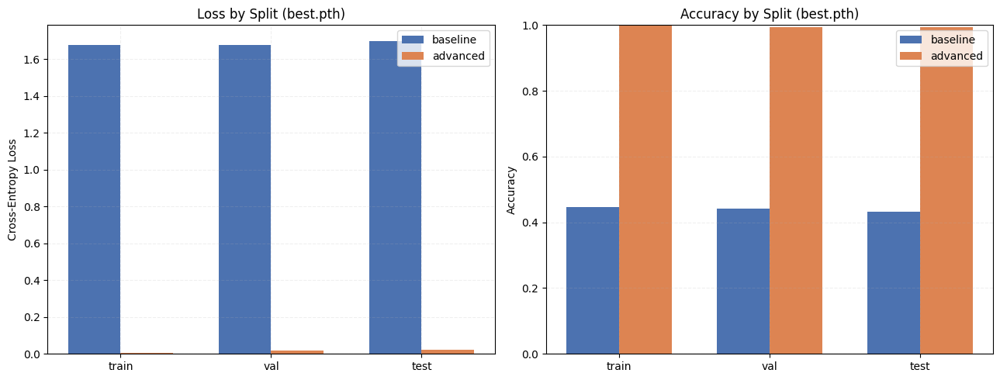

In [10]:
output_root = Path(getattr(cfg, "output_root", Path("artifacts")))
comparison_dir = prepare_latest_output_dir(output_root)

plot_split_metrics_comparison(
    baseline=baseline_result,
    advanced=advanced_result,
    output_path=comparison_dir / "split_metrics_comparison.png",
)

#### Test Head-to-Head Comparison

A direct comparison of **test set performance** between the two models with delta annotations:

- **Accuracy delta**: +56.31 percentage points (Advanced − Baseline)
- **Relative improvement**: +130.59% over baseline
- **Loss reduction**: −1.6784


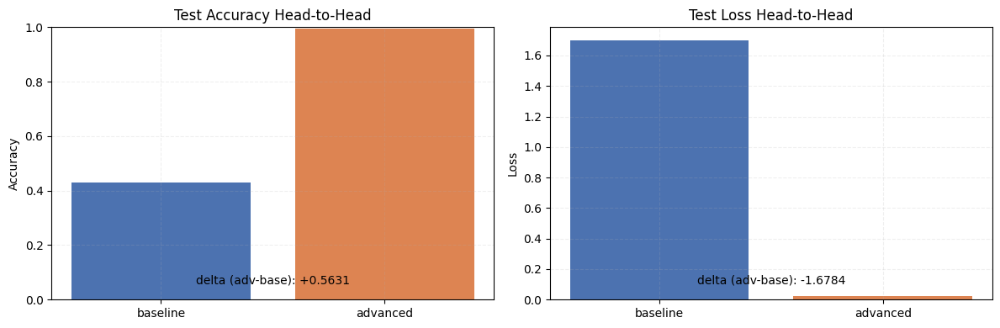

In [11]:
plot_test_head_to_head(
    baseline=baseline_result,
    advanced=advanced_result,
    deltas=deltas,
    output_path=comparison_dir / "test_head_to_head.png",
)

#### Training Curves Comparison

Epoch-by-epoch **loss** and **accuracy** curves for both models over 30 training epochs:

- **Baseline CNN**: Loss decreases slowly from ~3.58 to ~2.14 with accuracy climbing to only ~33% on training data — the model struggles to converge due to limited capacity.
- **Advanced CNN**: Loss drops rapidly in the first 5 epochs (3.02 → 0.36) and continues to near-zero by epoch 30. Accuracy reaches 99.87% on training data with the validation curve closely tracking — indicating minimal overfitting.

The CosineAnnealingLR scheduler gradually reduces the learning rate from 1e-3 to 0, allowing fine-grained convergence in later epochs.

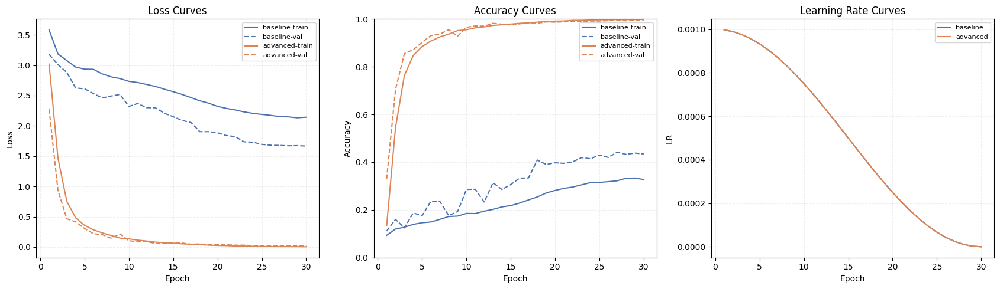

In [12]:
baseline_history = load_optional_history("baseline", model_dirs["baseline"])
advanced_history = load_optional_history("advanced", model_dirs["advanced"])
plot_training_curves_comparison(
    baseline_history=baseline_history,
    advanced_history=advanced_history,
    output_path=comparison_dir / "training_curves_comparison.png",
)

#### Test Confusion Matrices

Side-by-side **38×38 confusion matrices** visualize per-class prediction patterns on the test set:

- **Baseline CNN**: Shows significant off-diagonal mass with misclassifications scattered across classes — particularly among visually similar diseases (e.g., multiple Tomato conditions).
- **Advanced CNN**: Displays a near-perfect diagonal with virtually no off-diagonal entries, confirming the ability to distinguish even fine-grained class differences.

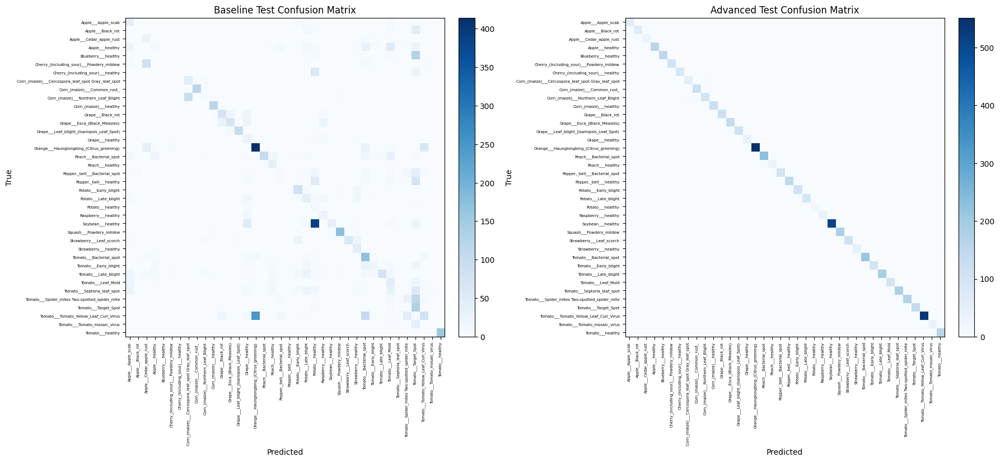

In [13]:
plot_confusion_matrices_comparison(
    baseline_cm=baseline_result["test_confusion_matrix"],
    advanced_cm=advanced_result["test_confusion_matrix"],
    class_names=loaders["class_names"],
    output_path=comparison_dir / "test_confusion_matrices_comparison.png",
)

#### Per-Class Accuracy Comparison

This chart breaks down **test accuracy by individual class** for both models across all 38 disease/healthy categories.

- The **Advanced CNN** achieves near-perfect (≥98%) accuracy across all 38 classes.
- The **Baseline CNN** shows high variance — some classes reach ~80% while others fall below 20%, indicating the shallow architecture learns certain visual patterns but fails on more subtle disease distinctions.

Results are also exported to `per_class_accuracy_comparison.csv` for detailed per-class inspection.

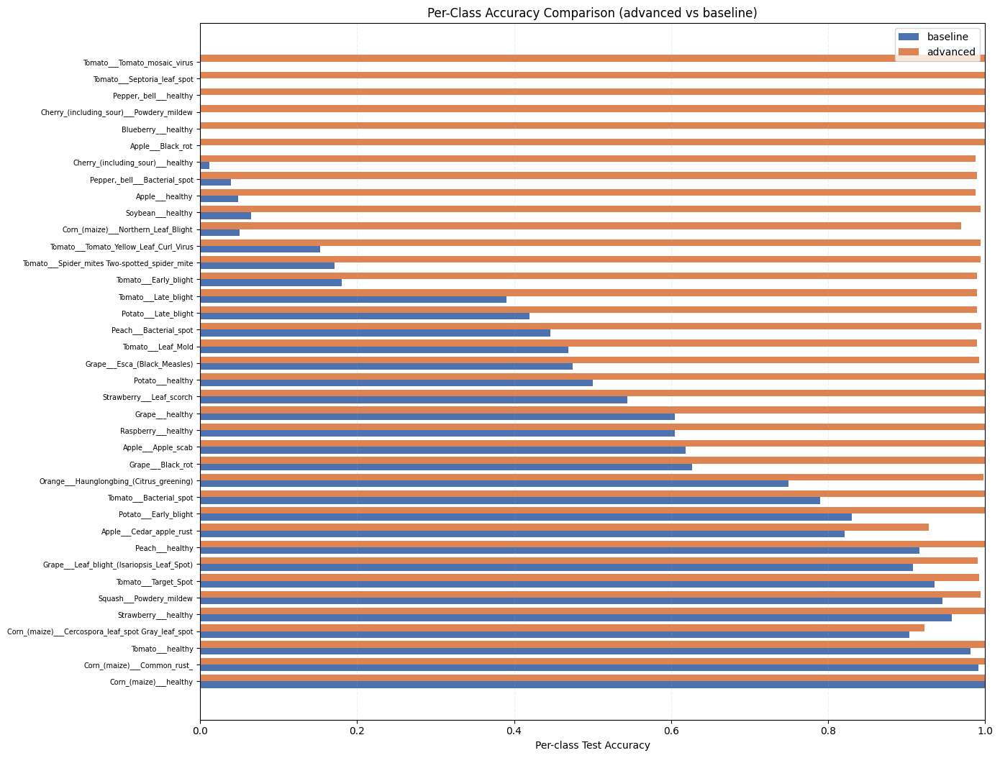

In [14]:
plot_and_save_per_class_comparison(
    class_names=loaders["class_names"],
    baseline_cm=baseline_result["test_confusion_matrix"],
    advanced_cm=advanced_result["test_confusion_matrix"],
    output_png=comparison_dir / "per_class_accuracy_comparison.png",
    output_csv=comparison_dir / "per_class_accuracy_comparison.csv",
)

In [16]:
write_summary_json(
    output_path=comparison_dir / "comparison_summary.json",
    device=cfg.device,
    loaders=loaders,
    baseline_result=baseline_result,
    advanced_result=advanced_result,
    baseline_metrics_json=baseline_metrics_json,
    advanced_metrics_json=advanced_metrics_json,
    deltas=deltas,
)
print(f"[eval] comparison artifacts saved to {comparison_dir.resolve()}")


[eval] comparison artifacts saved to /Users/biitu/Documents/Code/Learn/Udacity Masters/Projects/Capstone/Project 4/artifacts/model_comparison/latest


## 8. Notebook Summary

1. This notebook implemented a controlled deep learning experiment for **plant leaf disease classification** using the PlantVillage dataset (54,305 images across 38 classes, sourced from Hughes & Salathé, 2015).
2. A **BaselineCNN** (2 conv blocks + MLP) was compared against an **AdvancedCNN** (4 residual stages with GroupNorm and global average pooling), with all training hyperparameters held constant (AdamW, lr=1e-3, CosineAnnealing, 30 epochs, batch size 32).
3. The Advanced model achieved **99.43% test accuracy** versus the Baseline's **43.12%**, a gain of **+56.31 percentage points** (+130.59% relative improvement).
4. The Baseline model severely underfits — its two convolutional layers lack the capacity to distinguish 38 fine-grained classes, with 6 classes scoring 0% accuracy, while the Advanced model's residual connections and progressive spatial downsampling enable robust feature learning across all categories.
5. A key challenge was the long training time for the Advanced model (~33 min/epoch vs ~2 min/epoch for Baseline on MPS), reflecting the compute cost of deeper architectures.
6. The near-perfect accuracy of the Advanced model on this curated lab dataset suggests that cross-dataset evaluation using real-world field images would be a valuable next step to assess generalization and potential overfitting to dataset-specific patterns.